# plot intensity variance vs nuclear size for 3D images
This notebook is designed for looking at a single batch of data and do various diagnostic plots to decide how to filter the data.


In [1]:
import napari
import torch
from skimage.measure import regionprops_table, regionprops
import scipy as sp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from matplotlib_scalebar.scalebar import ScaleBar
import gc
import seaborn as sns
from sklearn.mixture import GaussianMixture
from bioio import BioImage
import bioio_nd2
import bioio_tifffile
from bioio.writers import OmeTiffWriter


anisotropy = (3.2,1,1) # Relative scale of (Z,X,Y) axes

nucChannel = 0 # red emerin rings
spotChannel = 1 # green spots

# in lucien's original scripts:
# channel 0 is green spots
# channel 1 is red emerin

In [6]:
# on server
base_path = '/mnt/external.data/MeisterLab/jsemple/lhinder/segmentation_Dario/'
df_paths = pd.DataFrame.from_dict({'data_path': [base_path+'/DPY27/1268/20240915_3d/']})

output_path=base_path+'/DPY27_SDC1_3d/'

if not os.path.exists(output_path+"/plots"):
    os.makedirs(output_path+"/plots")

df=pd.DataFrame()
dist=pd.DataFrame()
for path in df_paths['data_path']:
    df_tmp=pd.read_csv(path+"nuclei_analysis_v001.csv")
    df = pd.concat([df,df_tmp])
    dist_tmp=pd.read_pickle(path+"dist_analysis_v001.pkl")
    dist = pd.concat([dist,dist_tmp])

df.head()
dist.head()

,label,bb_dimZ,bb_dimY,bb_dimX,centroid_z,centroid_y,centroid_x,major_axis_length,solidity,mean,...,variance,max,min,volume,id,intensity_dist_nuclei,intensity_dist_spots,intensity_dist,zproj_spots,zproj_nuclei
0,1,3,332,196,10.237467,450.775726,209.588391,764.512529,0.087499,121.188654,...,88.081824,148,99,758,DPY27_3d_20240915_1268_E_bean_15um,[],[],[],"[[0, 126, 122, 113, 116, 126, 136, 0, 0, 0, 0,...","[[0, 129, 126, 114, 130, 118, 116, 0, 0, 0, 0,..."
0,2,13,51,48,17.092244,602.730192,235.823937,48.632410,0.728521,213.400834,...,3765.188456,793,105,11990,DPY27_3d_20240915_1268_E_bean_15um,"[134.06474820143885, 140.66141732283464, 144.1...","[202.6043165467626, 217.77165354330708, 231.94...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
0,3,24,48,58,23.818743,465.149410,405.504229,59.554474,0.738189,227.012229,...,20523.515241,1047,99,26250,DPY27_3d_20240915_1268_E_bean_15um,"[136.09174311926606, 135.79, 137.9076923076923...","[188.52293577981652, 201.32, 206.5692307692307...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
0,4,13,47,42,17.885833,526.404655,261.189650,47.890527,0.919311,208.377154,...,13510.819916,854,99,15381,DPY27_3d_20240915_1268_E_bean_15um,"[140.14110429447854, 143.66883116883116, 147.5...","[154.62576687116564, 148.98701298701297, 152.5...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14..."
0,5,10,47,50,16.749367,537.583875,332.809957,50.926443,0.926797,179.198181,...,8683.527708,720,94,14623,DPY27_3d_20240915_1268_E_bean_15um,"[131.55307262569832, 138.69398907103826, 144.7...","[127.77094972067039, 130.05464480874318, 134.2...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


## Add some variables
Radius might scale more linearly than volume
Coefficient of variation is independent of the mean signal

In [9]:
def radiusFromVolume(volume):
    return (3*volume/(4*np.pi))**(1/3)

def coefficientOfVariation(std,mean):
    return std/mean


df['radius'] = radiusFromVolume(df['volume'])
df['cv'] = coefficientOfVariation(df['std'],df['mean'])
df['zx_ratio'] = (df['bb_dimZ']*anisotropy[0])/(df['bb_dimX']*anisotropy[2])
df['zy_ratio'] = (df['bb_dimZ']*anisotropy[0])/(df['bb_dimY']*anisotropy[1])
df['xy_ratio'] = (df['bb_dimX']*anisotropy[2])/(df['bb_dimY']*anisotropy[1])

df.head()
#sns.scatterplot(data=df, x="volume", y="radius")
#sns.scatterplot(data=df, x="mean", y="std")
#sns.scatterplot(data=df, x="mean", y="cv")

,label,bb_dimZ,bb_dimY,bb_dimX,centroid_z,centroid_y,centroid_x,major_axis_length,solidity,mean,...,denoised_filepath,zproj_spots_x,zproj_nuclei_x,radius,cv,zx_ratio,zy_ratio,xy_ratio,zproj_spots_y,zproj_nuclei_y
0,1,3,332,196,10.237467,450.775726,209.588391,764.512529,0.087499,121.188654,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,5.656227,0.077443,0.048980,0.028916,0.590361,"[[0, 126, 122, 113, 116, 126, 136, 0, 0, 0, 0,...","[[0, 129, 126, 114, 130, 118, 116, 0, 0, 0, 0,..."
1,2,13,51,48,17.092244,602.730192,235.823937,48.632410,0.728521,213.400834,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,14.198535,0.287539,0.866667,0.815686,0.941176,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
2,3,24,48,58,23.818743,465.149410,405.504229,59.554474,0.738189,227.012229,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,18.436575,0.631069,1.324138,1.600000,1.208333,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
3,4,13,47,42,17.885833,526.404655,261.189650,47.890527,0.919311,208.377154,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,15.427610,0.557816,0.990476,0.885106,0.893617,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14..."
4,5,10,47,50,16.749367,537.583875,332.809957,50.926443,0.926797,179.198181,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,15.169897,0.520013,0.640000,0.680851,1.063830,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


## Plotting functions



In [10]:
def histogramsOfVariables(df, variables):
    fig, axs = plt.subplots(len(variables)//5+(1 if len(variables)%5>0 else 0), 5, figsize=(12, 12))
    for i, var in enumerate(variables):
        sns.histplot(data=df, x=var, color='blue', ax=axs[i//5, i%5])
        axs[i//5, i%5].axvline(df[var].quantile(0.01), 0, 1, color='black', ls='--')
        axs[i//5, i%5].axvline(df[var].quantile(0.99), 0, 1, color='black', ls='--')
    fig.suptitle("histograms with 1st and 99th quantiles")
    plt.tight_layout()
    plt.show()

def plot_nuclei_crop(df, dataVar, top=True, nuclei=True, nb_nuc=100):
    '''Plot a cropped region of 100 nuclei with best or worst value from each image'''
    if top:
        extreme_n = df.nlargest(nb_nuc,dataVar)
    else:   
        extreme_n = df.nsmallest(nb_nuc,dataVar)
    fig, axs = plt.subplots(nb_nuc//10, 10, figsize=(10, 10))
    for i,index in enumerate(extreme_n.index):
        if nuclei:
            axs[i//10,i%10].imshow(df.iloc[index].zproj_nuclei)
        else:
            axs[i//10,i%10].imshow(df.iloc[index].zproj_spots)
        axs[i//10,i%10].title.set_text(np.round(df[dataVar].iloc[index],2))
    fig.suptitle(str("nuclei " if nuclei else "spots ")+dataVar+str(" top" if top else " bottom")+" values")
    plt.tight_layout()
    plt.show()


def plot_random_nuclei_crop(df, nuclei=True):
    '''Plot a cropped region of 100 random nuclei'''
    nb_nuc = 100
    np.random.seed(33)
    extreme_n = df.iloc[np.random.choice(range(len(df)),size = nb_nuc,replace = False)]
    fig, axs = plt.subplots(nb_nuc//10, 10, figsize=(10, 10))
    for i,index in enumerate(extreme_n.index):
        if nuclei:
            axs[i//10,i%10].imshow(df.iloc[index].zproj_nuclei)
        else:
            axs[i//10,i%10].imshow(df.iloc[index].zproj_spots)
        axs[i//10,i%10].title.set_text(index)
    fig.suptitle("Random "+str(" nuclei" if nuclei else " spots"))
    plt.tight_layout()
    plt.show()

def plotRegression(df,xVars,yVars):
    fig, axs = plt.subplots(len(xVars), len(yVars), figsize=(12, 6))
    for i in xVars:
        for j in yVars:
            r, p = sp.stats.pearsonr(x=df[i], y=df[j])
            sns.regplot(data=df, x=i, y=j, ax=axs[xVars.index(i),yVars.index(j)], robust=True, scatter_kws={'alpha':0.1,'s':10}, line_kws={'color':'red'})
            axs[xVars.index(i),yVars.index(j)].text(np.max(df[i])*0.8, np.max(df[j])*0.8, 'r={:.2f}'.format(r))
    plt.tight_layout()
    plt.show()


def plotScatter(df,xVars,yVars):
    fig, axs = plt.subplots(len(xVars), len(yVars), figsize=(12, 6))
    for i in xVars:
        for j in yVars:
            sns.scatterplot(data=df, x=i, y=j, ax=axs[xVars.index(i),yVars.index(j)], alpha=0.1, size=10)
    plt.tight_layout()
    plt.show()

In [11]:
quantitativeVars = ["bb_dimZ", "bb_dimY", "bb_dimX", "centroid_z", "centroid_y", "centroid_x", "major_axis_length", "zx_ratio", "zy_ratio", "xy_ratio", "solidity", "mean", "median", "std","radius","cv"]
#quantiles=pd.DataFrame()
quantiles = df[quantitativeVars].quantile([0.01, 0.99])
#higherQ = df[quantitativeVars].quantile(0.99)
quantiles

/home/jsemple/miniforge3/envs/lhcellpose1/lib/python3.10/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


,bb_dimZ,bb_dimY,bb_dimX,centroid_z,centroid_y,centroid_x,major_axis_length,zx_ratio,zy_ratio,xy_ratio,solidity,mean,median,std,radius,cv
0.01,1.0,18.0,19.0,11.882119,17.264228,21.863759,23.568558,0.071111,0.072727,0.640000,0.766543,108.343646,108.0,6.691802,4.034113,0.061697
0.99,25.0,77.0,76.0,74.589968,1079.941623,903.945620,81.070162,1.280000,1.280000,1.693803,NaN,273.870165,236.0,163.292208,26.748490,0.680441


## Initial filtering and plotting histograms 
Histograms of different variables helps to decide which variables to filter by and with what values 

In [12]:
filter_indeces = (df['solidity']>=0.5) 
filt=df[filter_indeces]
filt=filt.reset_index(drop=True)
filt.head()

,label,bb_dimZ,bb_dimY,bb_dimX,centroid_z,centroid_y,centroid_x,major_axis_length,solidity,mean,...,denoised_filepath,zproj_spots_x,zproj_nuclei_x,radius,cv,zx_ratio,zy_ratio,xy_ratio,zproj_spots_y,zproj_nuclei_y
0,2,13,51,48,17.092244,602.730192,235.823937,48.632410,0.728521,213.400834,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,14.198535,0.287539,0.866667,0.815686,0.941176,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
1,3,24,48,58,23.818743,465.149410,405.504229,59.554474,0.738189,227.012229,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,18.436575,0.631069,1.324138,1.600000,1.208333,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
2,4,13,47,42,17.885833,526.404655,261.189650,47.890527,0.919311,208.377154,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,15.427610,0.557816,0.990476,0.885106,0.893617,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14..."
3,5,10,47,50,16.749367,537.583875,332.809957,50.926443,0.926797,179.198181,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,15.169897,0.520013,0.640000,0.680851,1.063830,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
4,6,9,44,45,16.197679,570.622426,414.887215,47.014676,0.874448,213.524055,...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,NaN,NaN,13.663074,0.640061,0.640000,0.654545,1.022727,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


/home/jsemple/miniforge3/envs/lhcellpose1/lib/python3.10/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


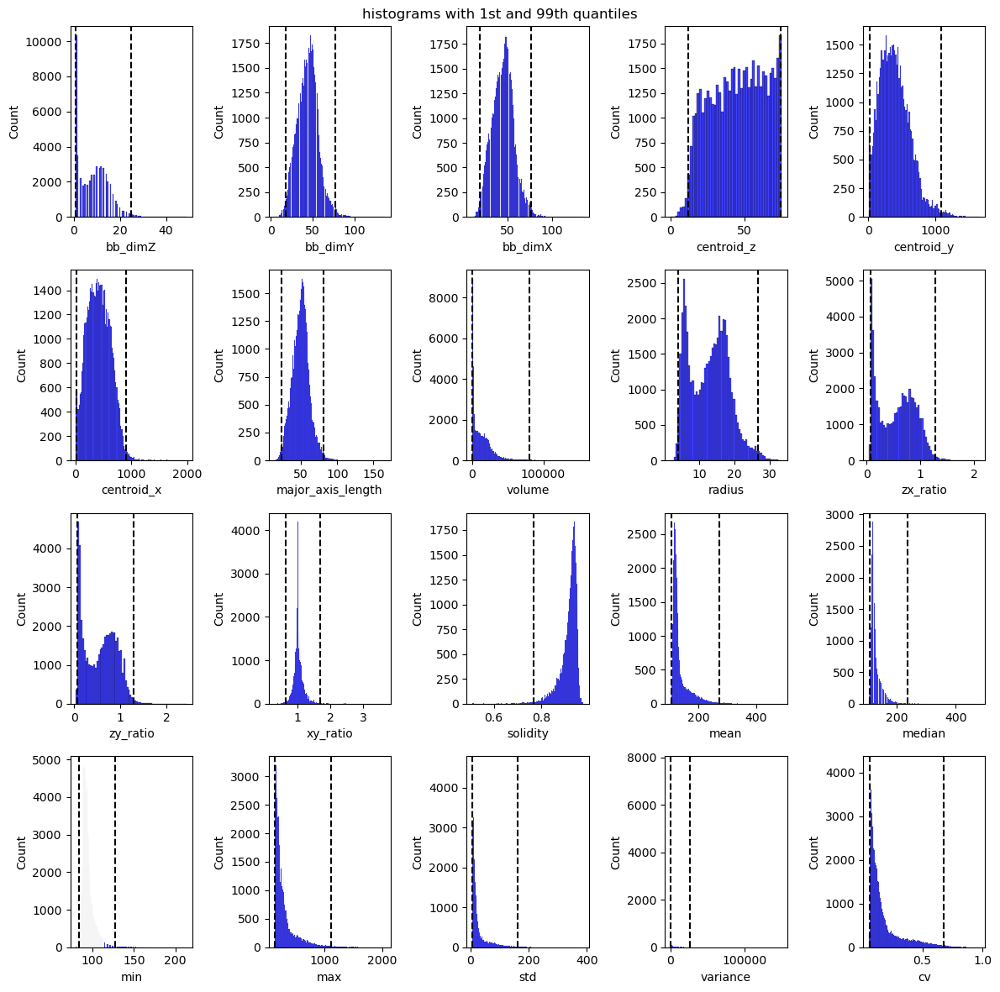

In [13]:
quantitativeVars = ["bb_dimZ", "bb_dimY", "bb_dimX", "centroid_z", "centroid_y", "centroid_x", "major_axis_length","volume", "radius", "zx_ratio", "zy_ratio", "xy_ratio", "solidity", "mean", "median", "min","max","std","variance","cv"]
histogramsOfVariables(filt,variables=quantitativeVars)

## Plot variables pairwise


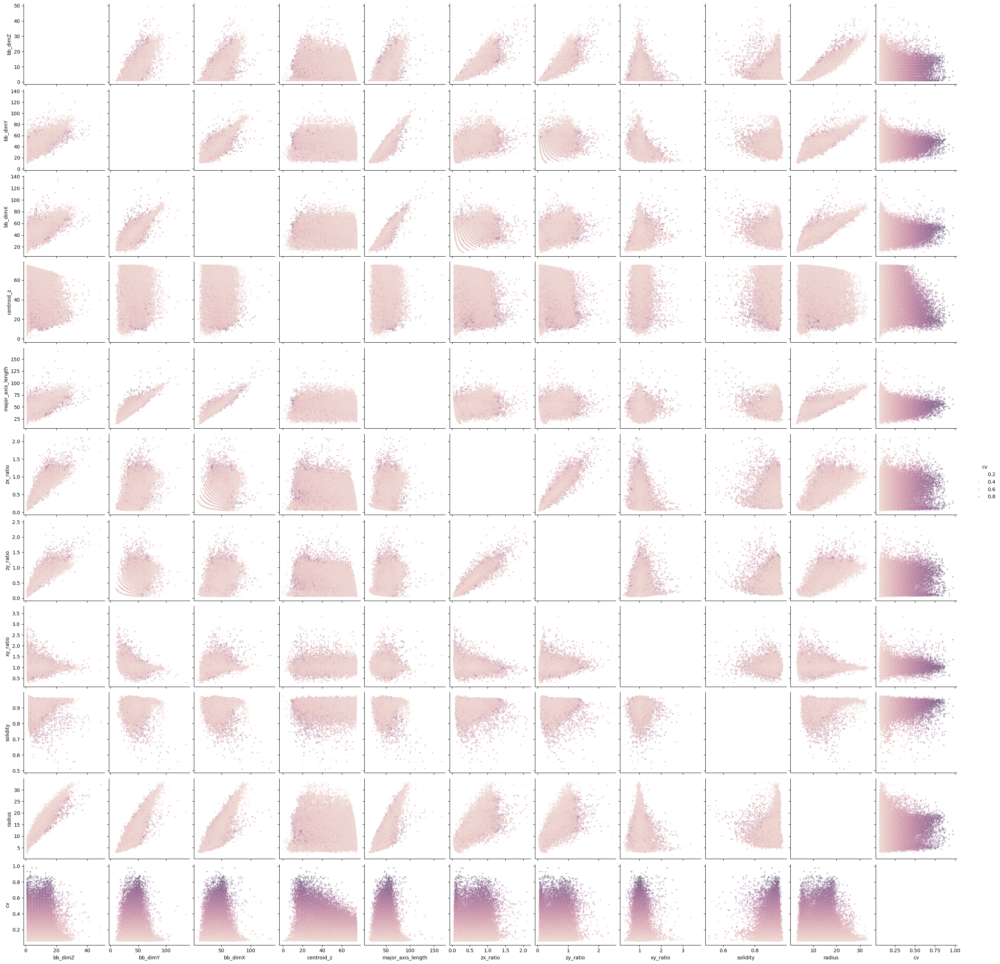

In [14]:
quantitativeVars = ["bb_dimZ", "bb_dimY", "bb_dimX", "centroid_z", "major_axis_length", "zx_ratio", "zy_ratio", "xy_ratio", "solidity", "radius","cv"]

sns.pairplot(data=filt[quantitativeVars], vars=quantitativeVars, hue="cv", plot_kws={'alpha':0.3,'s':10})
plt.show()



In [ ]:
quantitativeVars = [ "major_axis_length","radius", "solidity", "mean", "median", "std", "min","max", "cv"]
sns.pairplot(data=filt[quantitativeVars], vars=quantitativeVars, plot_kws={'alpha':0.3,'s':10}, hue='cv')
plt.show()

KeyboardInterrupt: 

## Plot nuclei crops
### random nuclei crops for comparison

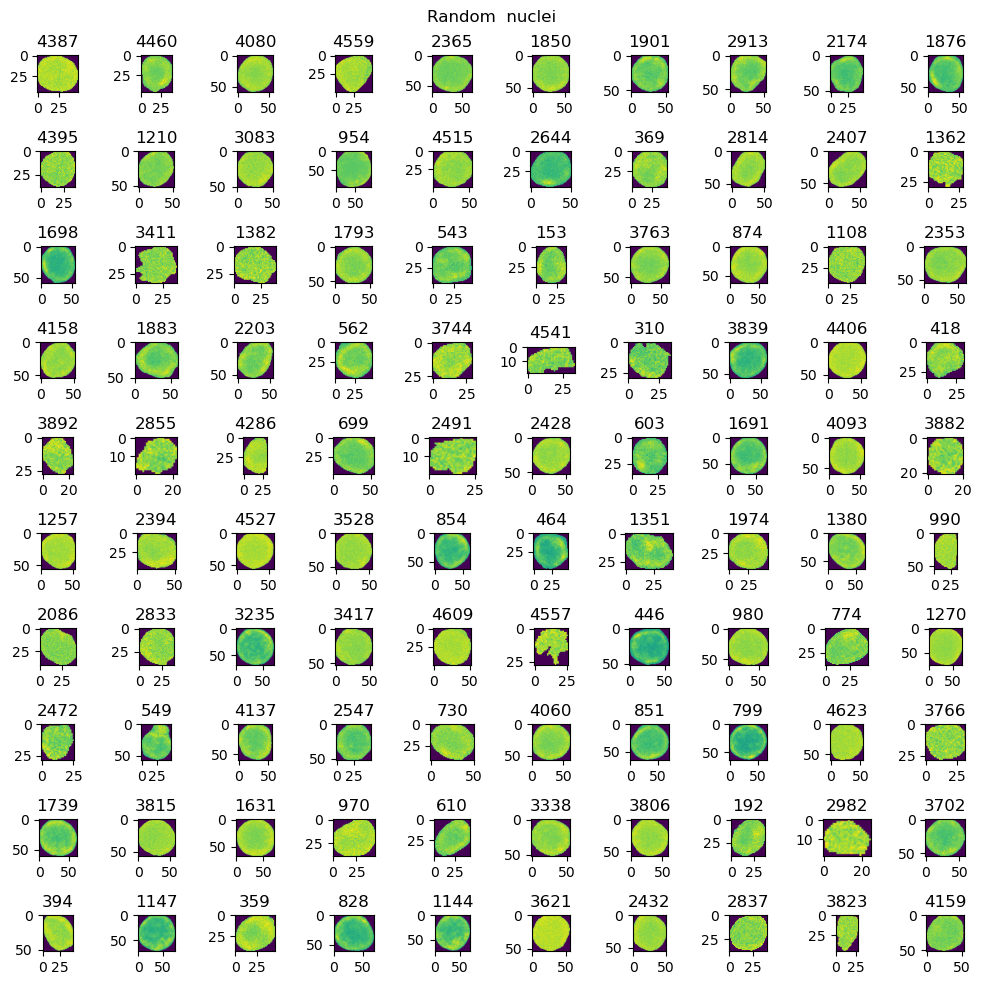

In [22]:
plot_random_nuclei_crop(filt, nuclei=True)

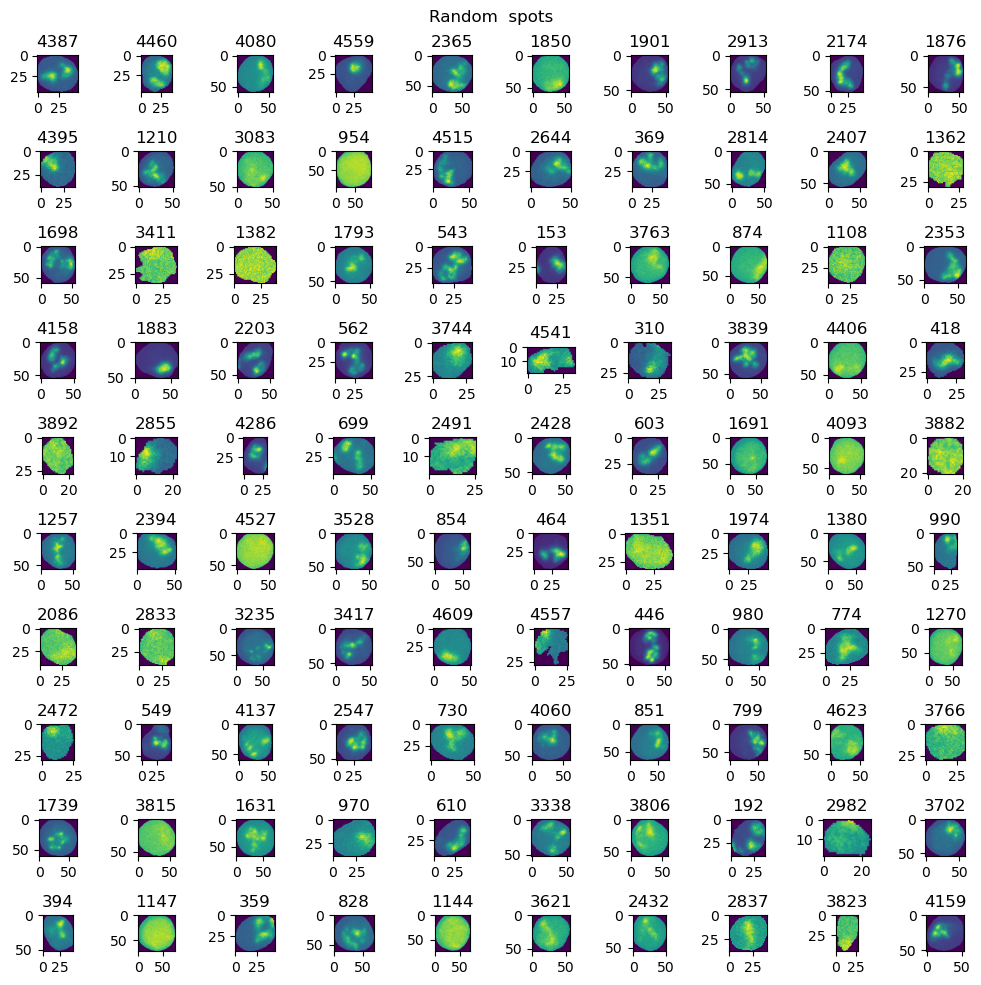

In [23]:
plot_random_nuclei_crop(filt, nuclei=False)

### Nuclei crops ordered by specific variable

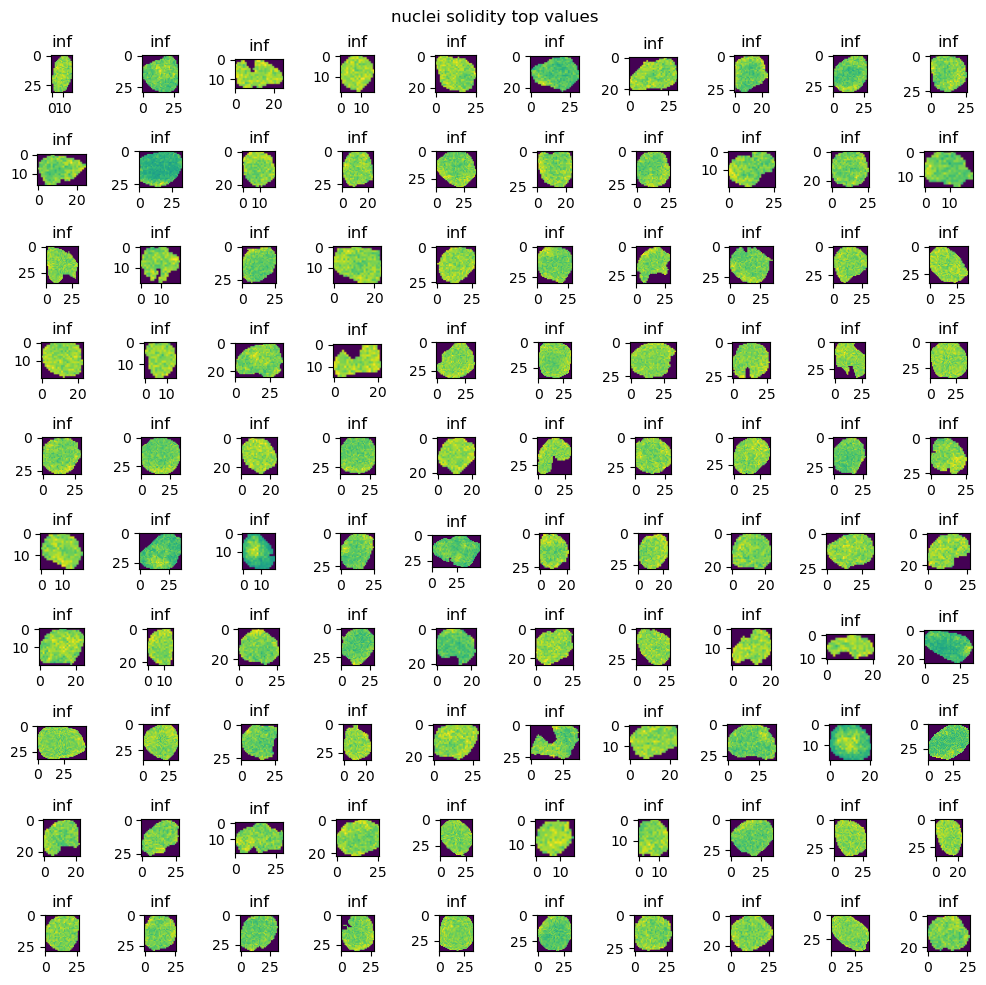

In [97]:
dataVar="solidity"
nuclei=True
plot_nuclei_crop(filt, dataVar, top=True, nuclei=nuclei)

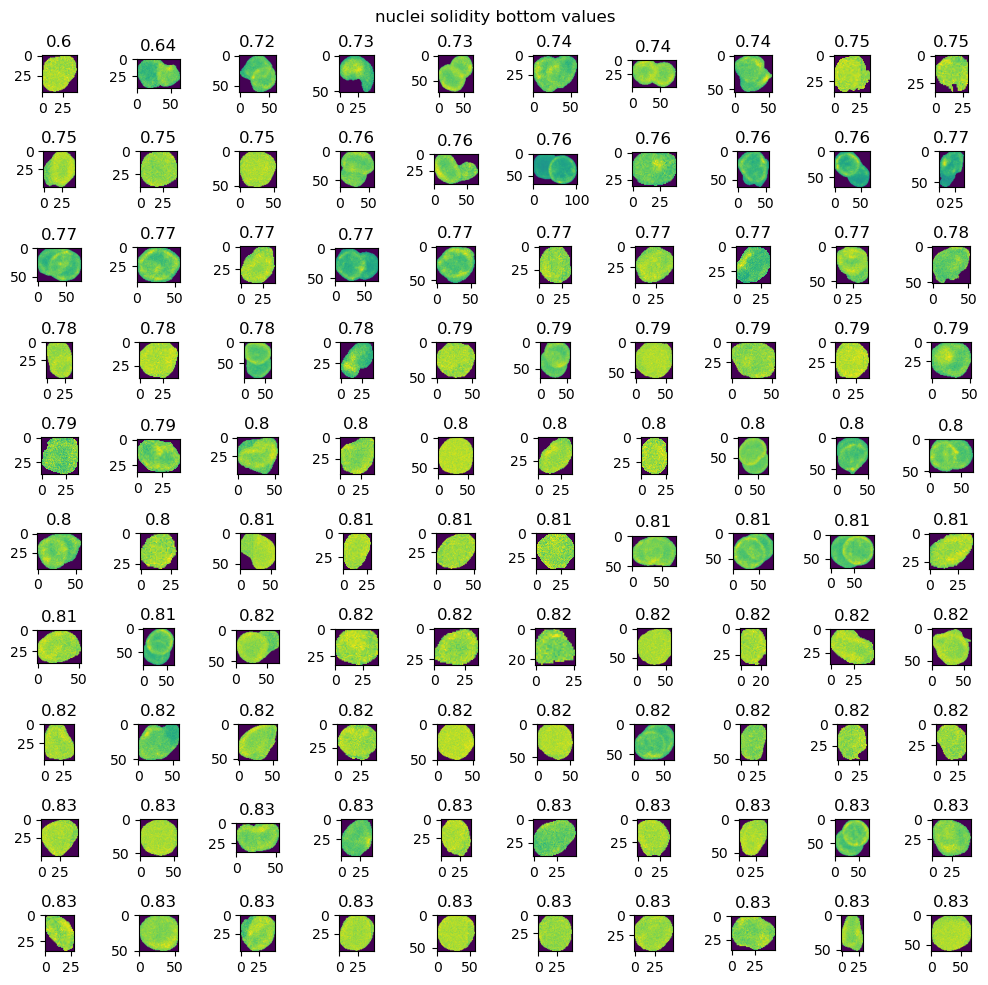

In [98]:
plot_nuclei_crop(filt, dataVar, top=False, nuclei=nuclei)

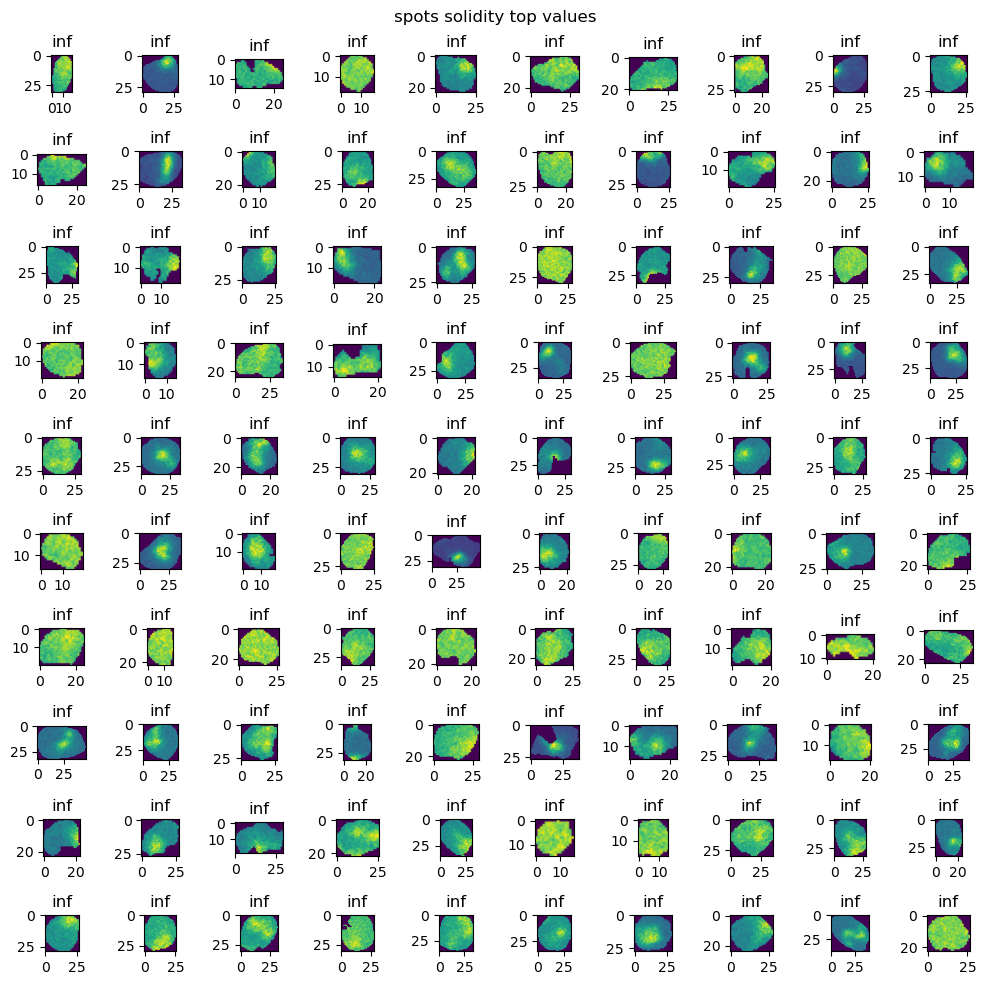

In [99]:
nuclei=False
plot_nuclei_crop(filt, dataVar, top=True, nuclei=nuclei)

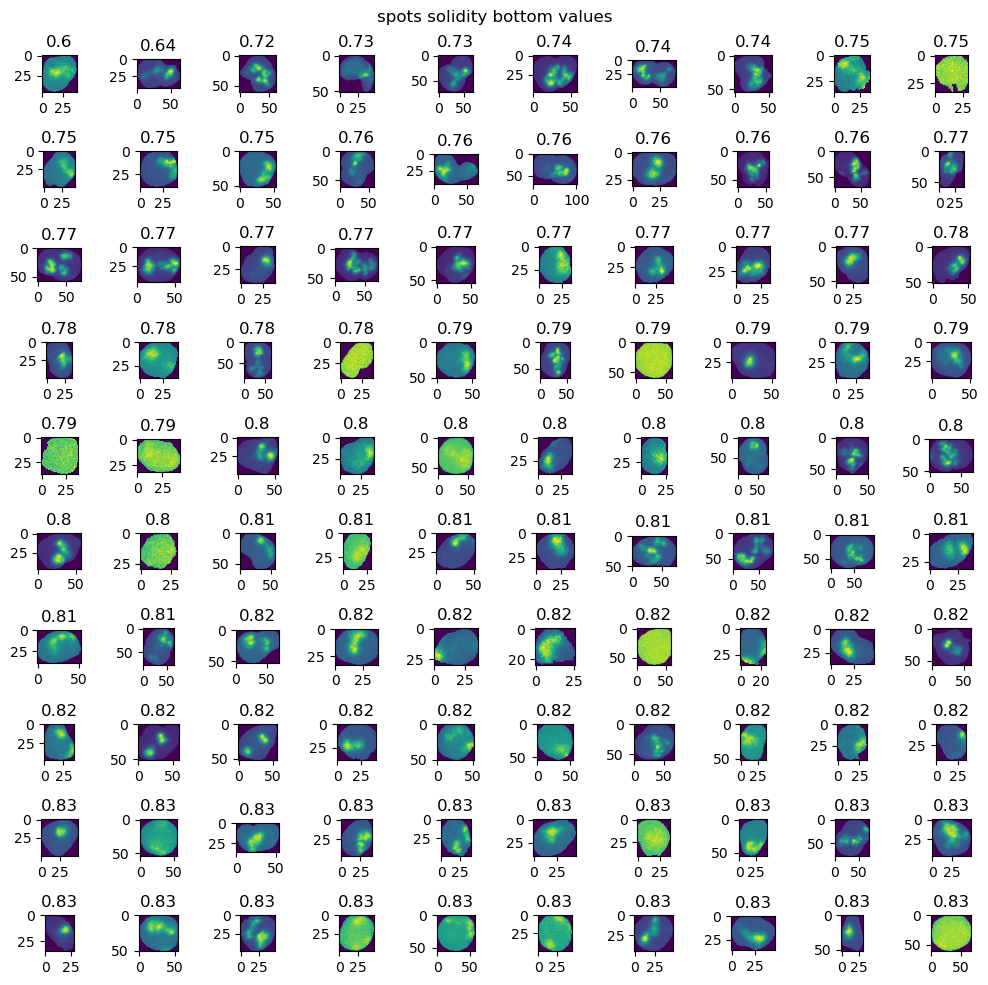

In [100]:
plot_nuclei_crop(filt, dataVar, top=False, nuclei=nuclei)

## Final filter and scatter/regression plots

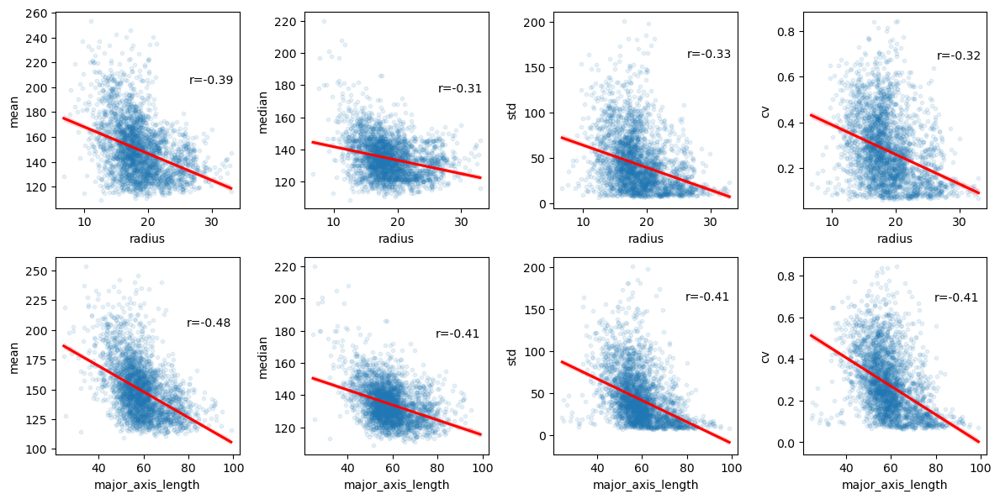

In [24]:
filter_indeces = (df['centroid_z']>=15) & (df['solidity']>=0.85) & (df['solidity']<=1) & (df['xy_ratio']>0.5) & (df['xy_ratio']<1.5) & (df['zx_ratio']>0.4) & (df['zx_ratio']<1.5) & (df['zy_ratio']>0.4) & (df['zy_ratio']<1.5)
filt=df[filter_indeces]
filt=filt.reset_index(drop=True)
filt

xVars = ['radius', 'major_axis_length']
yVars = ['mean','median', 'std', 'cv']



plotRegression(filt,xVars,yVars)

#plotScatter(filt,xVars,yVars)

In [ ]:

#filter_indeces = (df['solidity']>=0.5) 
#filter_indeces = (df['centroid_z']>=15) & (df['solidity']>=0.85) & (df['solidity']<=1) & (df['xy_ratio']>0.5) & (df['xy_ratio']<1.5) & (df['zx_ratio']>0.4) & (df['zx_ratio']<1.5) & (df['zy_ratio']>0.4) & (df['zy_ratio']<1.5)

filter_indeces =  (df['solidity']>=0.85)  & (df['xy_ratio']>0.8) & (df['xy_ratio']<1.2) & (df['zx_ratio']>0.6) & (df['zx_ratio']<1.3) & (df['zy_ratio']>0.6) & (df['zy_ratio']<1.3)

#filter_indeces = (df['centroid_z']>=15) & (df['solidity']>=0.9) & (df['solidity']<=1) & (df['xy_ratio']>0.5) & (df['xy_ratio']<1.5) & (df['zx_ratio']>0.4) & (df['zx_ratio']<1.5) & (df['zy_ratio']>0.4) & (df['zy_ratio']<1.5)


filt=df[filter_indeces]
filt=filt.reset_index(drop=True)


x = 'major_axis_length'
y = 'cv'


#sns.scatterplot(data=filt, x=x, y=y, alpha=0.1, size=10)

r, p = sp.stats.pearsonr(x=filt[x], y=filt[y])
ax=sns.regplot(data=filt, x=x, y=y,  robust=False, lowess=True,scatter_kws={'alpha':0.1,'s':10}, line_kws={'color':'red'})
ax.text(np.max(filt[x])*0.8, np.max(filt[y])*0.8, 'r={:.2f},n={:.0f}'.format(r,len(filt)))

#plotRegression(filt,xVars,yVars)



TypeError: unsupported operand type(s) for /: 'int' and 'str'

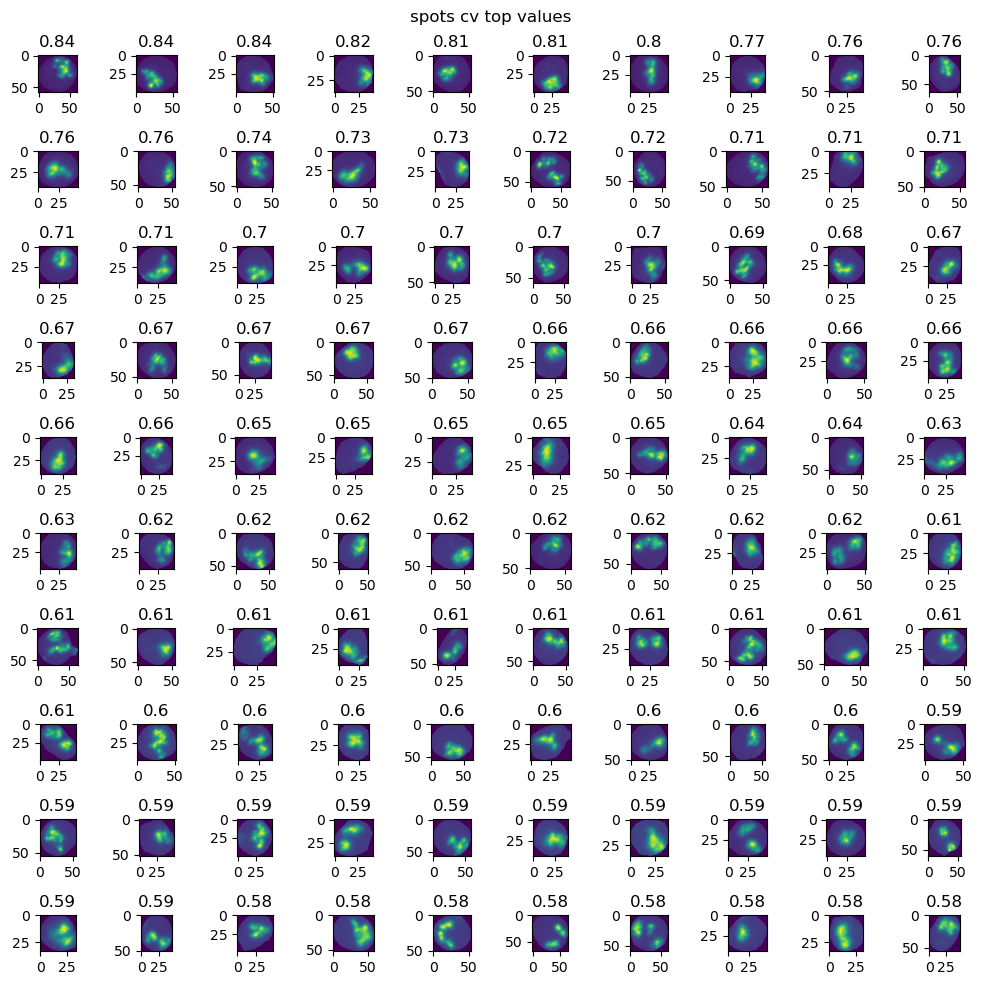

In [44]:
dataVar='cv'
plot_nuclei_crop(filt, dataVar, top=True, nuclei=False,nb_nuc=100)

In [19]:
pd.set_option("display.max_columns", None)
badnuc=[24,47,80,88,95,121,139,147,173,186,214,256,261,310,314,327]
ff[ff['label'].isin(badnuc)]

,label,bb_dimZ,bb_dimY,bb_dimX,centroid_z,centroid_y,centroid_x,major_axis_length,solidity,mean,median,std,sum,variance,max,min,volume,id,filename,date,experiment,strain,protein,raw_filepath,denoised_filepath,radius,cv,zx_ratio,zy_ratio,xy_ratio,zproj_spots,zproj_nuclei
8,256,8,27,25,47.577744,568.449023,249.787970,28.575220,0.929290,202.612632,201.0,22.534806,673687,507.817465,280,137,3325,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,9.259077,0.111221,1.024000,0.948148,0.925926,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 228, 251, 273, 24...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 123, 130, 144, 14..."
12,314,9,27,23,58.003149,514.731567,223.260562,28.699712,0.927928,198.941748,198.0,27.529832,758167,757.891647,295,128,3811,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,9.689844,0.138381,1.252174,1.066667,0.851852,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 15...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 11..."
13,327,10,31,27,60.888678,552.736702,335.952128,32.211203,0.916594,165.477204,165.0,14.515303,871072,210.694009,220,118,5264,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,10.791349,0.087718,1.185185,1.032258,0.870968,"[[0, 0, 0, 0, 0, 0, 0, 0, 147, 154, 177, 184, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 140, 125, 136, 131, ..."
19,47,4,20,24,18.387818,745.607556,172.172706,25.156504,0.940537,127.884348,125.0,16.750347,165866,280.574134,212,94,1297,DPY27_3d_20240915_1268_E_bean_15um_02,20240915_1268_E_bean_15um_02,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,6.765249,0.130980,0.533333,0.640000,1.200000,"[[0, 0, 0, 0, 0, 0, 0, 126, 113, 122, 122, 120...","[[0, 0, 0, 0, 0, 0, 0, 113, 141, 139, 142, 140..."
22,80,7,24,26,30.002386,730.295501,278.281527,27.943265,0.947063,180.331288,180.0,16.853311,529092,284.034079,246,122,2934,DPY27_3d_20240915_1268_E_bean_15um_02,20240915_1268_E_bean_15um_02,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,8.880904,0.093457,0.861538,0.933333,1.083333,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 197, 197...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 175, 176..."
25,121,7,23,26,38.888323,613.802900,219.288793,25.029250,0.921300,218.619514,220.0,41.898601,557917,1755.492770,324,117,2552,DPY27_3d_20240915_1268_E_bean_15um_02,20240915_1268_E_bean_15um_02,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,8.477426,0.191651,0.861538,0.973913,1.130435,"[[0, 0, 0, 0, 0, 0, 142, 148, 158, 169, 160, 1...","[[0, 0, 0, 0, 0, 0, 123, 133, 131, 129, 128, 1..."
29,186,6,21,23,49.580797,529.708290,488.564008,24.492564,0.926142,177.886674,178.0,20.589088,339052,423.910557,243,119,1906,DPY27_3d_20240915_1268_E_bean_15um_02,20240915_1268_E_bean_15um_02,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,7.691507,0.115743,0.834783,0.914286,1.095238,"[[0, 0, 0, 0, 0, 142, 147, 175, 153, 155, 186,...","[[0, 0, 0, 0, 0, 122, 135, 141, 136, 128, 130,..."
30,327,5,30,36,73.242036,575.381661,288.447157,37.516836,0.925344,142.869902,139.0,19.983695,479900,399.348064,245,103,3359,DPY27_3d_20240915_1268_E_bean_15um_02,20240915_1268_E_bean_15um_02,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,9.290529,0.139873,0.444444,0.533333,1.200000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
31,24,10,33,30,15.767487,176.512155,291.6859

In [18]:
pd.set_option("display.max_columns", None)
ff[~ff['label'].isin(badnuc)]

,label,bb_dimZ,bb_dimY,bb_dimX,centroid_z,centroid_y,centroid_x,major_axis_length,solidity,mean,median,std,sum,variance,max,min,volume,id,filename,date,experiment,strain,protein,raw_filepath,denoised_filepath,radius,cv,zx_ratio,zy_ratio,xy_ratio,zproj_spots,zproj_nuclei
0,26,8,38,33,18.333010,498.119845,306.867378,38.126675,0.920089,219.483261,148.0,148.018921,1357065,21909.600844,950,101,6183,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,11.385975,0.674397,0.775758,0.673684,0.868421,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
1,109,7,36,33,31.093676,109.231894,15.924005,39.173332,0.928199,141.658790,134.0,29.535519,833237,872.346853,328,96,5882,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,11.198129,0.208498,0.678788,0.622222,0.916667,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 115, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 110, ..."
2,138,7,33,36,34.312084,648.980633,491.012306,37.862145,0.915420,188.109744,160.0,73.859137,932460,5455.172140,686,108,4957,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,10.577347,0.392639,0.622222,0.678788,1.090909,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 126, 1...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 119, 116, 1..."
3,150,12,37,37,37.807741,709.393292,456.783660,38.312545,0.911571,169.588769,145.0,61.741606,1739472,3812.025878,494,98,10257,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,13.478573,0.364067,1.037838,1.037838,1.000000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
4,182,8,33,29,40.610300,563.817416,323.076966,35.297979,0.944631,219.911798,183.0,94.783909,1174329,8983.989411,603,107,5340,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,10.843036,0.431009,0.882759,0.775758,0.878788,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 131, 143...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 133, 138..."
5,190,11,36,38,42.972695,294.179317,396.808966,39.485536,0.922896,208.021294,148.0,122.219327,2041729,14937.563785,739,99,9815,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,13.282115,0.587533,0.926316,0.977778,1.055556,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
6,196,7,34,34,41.018462,691.005900,483.073848,38.558580,0.932884,186.257328,161.0,71.618868,978596,5129.262294,536,99,5254,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,10.784512,0.384516,0.658824,0.658824,1.000000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
7,240,11,35,36,47.700284,176.316880,145.812382,37.222527,0.931320,170.773319,142.0,67.382673,1442693,4540.424586,522,99,8448,DPY27_3d_20240915_1268_E_bean_15um,20240915_1268_E_bean_15um,20240915,3d,1268,DPY27,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,/mnt/external.data/MeisterLab/Dario/Imaging/DP...,12.634414,0.394574,0.977778,1.005714,1.028571,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
9,257,7,35,29,47.108893,595.251059,177.010486,38.898281,0.90

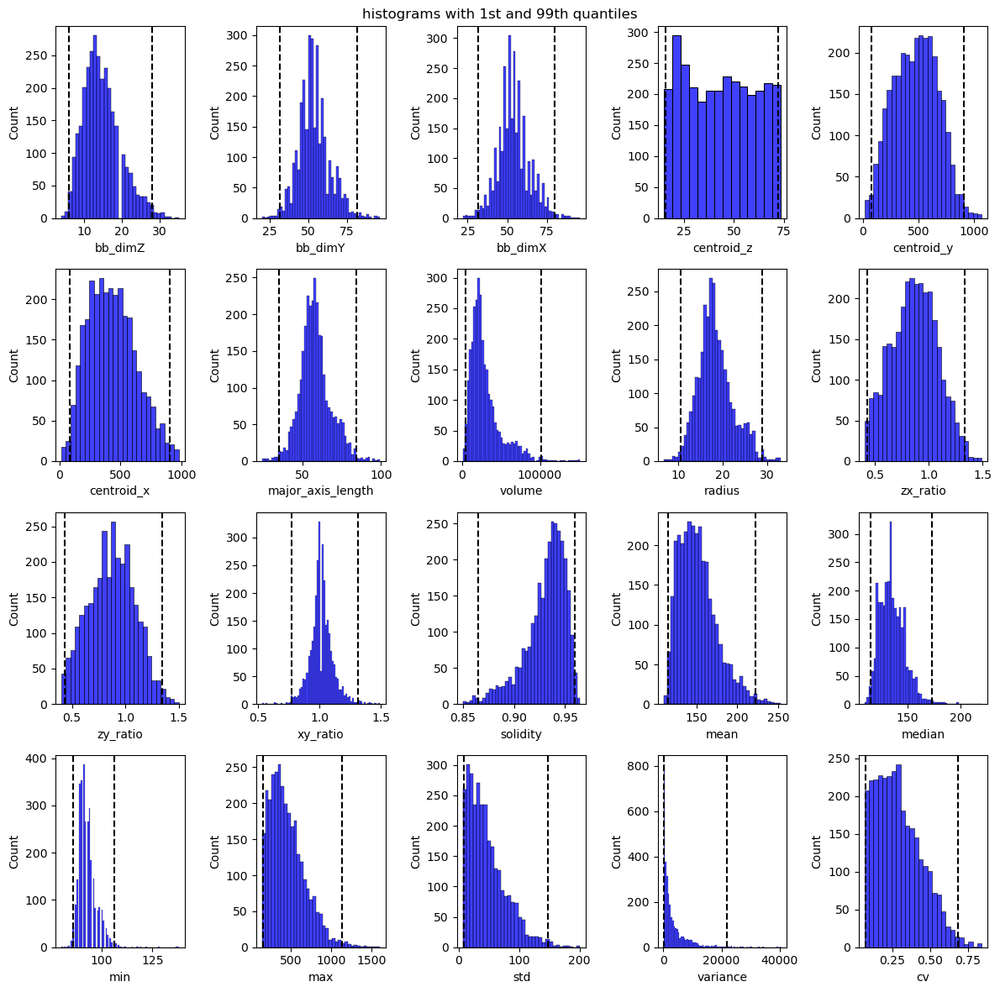

In [113]:
quantitativeVars = ["bb_dimZ", "bb_dimY", "bb_dimX", "centroid_z", "centroid_y", "centroid_x", "major_axis_length","volume", "radius", "zx_ratio", "zy_ratio", "xy_ratio", "solidity", "mean", "median", "min","max","std","variance","cv"]
histogramsOfVariables(filt,variables=quantitativeVars)

In [ ]:

plt.figure(figsize = (30,5),dpi = 300)
#plt.ylim((0,0.25e5))
violin_plot = sns.violinplot(data=df_filt, x="group", y="mass", inner=None)
for item in violin_plot.get_xticklabels():
    item.set_rotation(90)
violin_plot.tick_params(labelsize=10)
plt.title('Mean nuclear volume (in px^3) per group')